In [1]:
import argparse
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.utils.data
import torch.optim as optim

import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

from torchmetrics.image.inception import InceptionScore
from torchmetrics.image.fid import FrechetInceptionDistance

In [2]:
# set random seed for reproducibility
# manual_seed = 1500
manual_seed = random.randint(1, 10000) # use if you want new results in different runs

print("Random Seed:", manual_seed)

random.seed(manual_seed)
torch.manual_seed(manual_seed)

Random Seed: 5333


In [3]:
# define hyper-parameters

# data_path = "data/celeba/"
data_path = "data/chest_xray"
num_workers = 2
num_channel = 3

beta1 = 0.5
leaky_relu_weight = 0.2
num_gpus = 1   # use 0 for CPU mode

# variable hyperparameters
batch_size = 32

latent_ch = 100
latent_wh = 1

# all images will be resized to "img_size" using a dataloader transform
img_size = 128
gen_feat_size = 64  # Ngf
disc_feat_size = 16  # Ndf

num_epochs = 20

lr = 2e-4

In [4]:
## Load the training dataset

# define dataset transform
data_transform = transforms.Compose([transforms.Resize(img_size),
                                     transforms.CenterCrop(img_size),
                                     transforms.ToTensor(),
                                     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                                   ])

# create the dataset
dataset = dset.ImageFolder(root=data_path, transform=data_transform)

# create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)

# decide which device to run on - GPU or CPU
print("Is cuda available: ", torch.cuda.is_available())
device = torch.device("cuda:0" if (torch.cuda.is_available() and num_gpus > 0) else "cpu")

print("Number of Real Training Images:", len(dataloader.dataset))

Is cuda available:  True
Number of Real Training Images: 5232


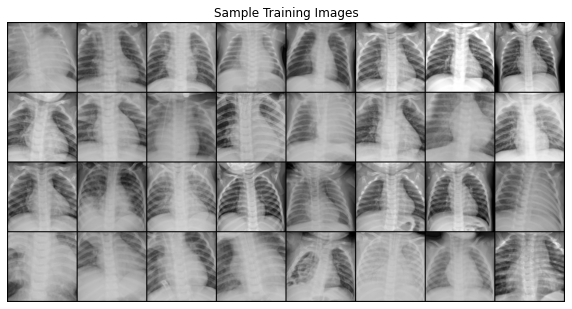

In [5]:
# plot some sample training images
sample_batch = next(iter(dataloader))
img_grid = vutils.make_grid(sample_batch[0].to(device)[:64], padding=2, normalize=True).cpu()

plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Sample Training Images")
plt.imshow(np.transpose(img_grid, axes=(1,2,0)))

In [6]:
def weights_init(net_layer):
    """
        custom weight initilization class for generator and discriminator class
    """
    classname = net_layer.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(tensor=net_layer.weight.data, mean=0.0, std=0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(tensor=net_layer.weight.data, mean=1.0, std=0.02)
        nn.init.constant_(tensor=net_layer.bias.data, val=0)

In [7]:
# generator class module definition
class Generator_Module(nn.Module):
    def __init__(self, num_gpus):
        super(Generator_Module, self).__init__()
        self.num_gpus = num_gpus
        
        self.main = nn.Sequential(
            # input: latent vector Z - latent_dim (100 x w x w) --> 512 x 4 x 4
            nn.ConvTranspose2d(in_channels=latent_ch, out_channels=gen_feat_size * 8, kernel_size=4, 
                               stride=1, padding=0, bias=False), 
            nn.BatchNorm2d(num_features=gen_feat_size * 8), 
            nn.ReLU(inplace=True),
        
            # 512 x 4 x 4 --> 256 x 8 x 8
            nn.ConvTranspose2d(in_channels=gen_feat_size * 8, out_channels=gen_feat_size * 4, kernel_size=4, 
                               stride=2, padding=1, bias=False), 
            nn.BatchNorm2d(num_features=gen_feat_size * 4), 
            nn.ReLU(inplace=True),
        
            # 256 x 8 x 8 --> 128 x 16 x 16
            nn.ConvTranspose2d(in_channels=gen_feat_size * 4, out_channels=gen_feat_size * 2, kernel_size=4, 
                               stride=2, padding=1, bias=False), 
            nn.BatchNorm2d(num_features=gen_feat_size * 2), 
            nn.ReLU(inplace=True),
        
            # 128 x 16 x 16 --> 64 x 32 x 32
            nn.ConvTranspose2d(in_channels=gen_feat_size * 2, out_channels=gen_feat_size * 1, kernel_size=4, 
                               stride=2, padding=1, bias=False), 
            nn.BatchNorm2d(num_features=gen_feat_size * 1), 
            nn.ReLU(inplace=True),
            
            nn.ConvTranspose2d(in_channels=gen_feat_size * 1, out_channels=gen_feat_size // 2, kernel_size=4, 
                               stride=2, padding=1, bias=False), 
            nn.BatchNorm2d(num_features=gen_feat_size // 2), 
            nn.ReLU(inplace=True),
        
            # 64 x 32 x 32 --> 3 x 64 x 64
            nn.ConvTranspose2d(in_channels=gen_feat_size // 2, out_channels=num_channel, kernel_size=4, 
                               stride=2, padding=1, bias=False),
            nn.Tanh()
        )
        
    def forward(self, input_vec):
        return self.main(input_vec)

In [8]:
# instantiate the generator network
gen_net = Generator_Module(num_gpus).to(device)

# apply the weights_init function to randomly initialize the weights to mean=0, stddev=0.02
gen_net.apply(weights_init)

print(gen_net)

Generator_Module(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Batch

In [9]:
# define the discriminator network
class Discriminator_Module(nn.Module):
    def __init__(self, num_gpus):
        super(Discriminator_Module, self).__init__()
        self.num_gpus = num_gpus
        
        self.main = nn.Sequential(
            # 3 x 64 x 64 --> 64 x 32 x 32
            nn.Conv2d(in_channels=num_channel, out_channels=disc_feat_size, kernel_size=4, 
                      stride=2, padding=1, bias=False),
            nn.LeakyReLU(leaky_relu_weight, inplace=True),
            
            # 64 x 32 x 32 --> 128 x 16 x 16
            nn.Conv2d(in_channels=disc_feat_size, out_channels=disc_feat_size * 2, kernel_size=4, 
                      stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=disc_feat_size * 2),
            nn.LeakyReLU(leaky_relu_weight, inplace=True), 
            
            # 128 x 16 x 16 --> 256 x 8 x 8
            nn.Conv2d(in_channels=disc_feat_size * 2, out_channels=disc_feat_size * 4, kernel_size=4, 
                      stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=disc_feat_size * 4),
            nn.LeakyReLU(leaky_relu_weight, inplace=True), 
            
            # 256 x 8 x 8 --> 512 x 4 x 4
            nn.Conv2d(in_channels=disc_feat_size * 4, out_channels=disc_feat_size * 8, kernel_size=4, 
                      stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=disc_feat_size * 8),
            nn.LeakyReLU(leaky_relu_weight, inplace=True), 
            
            nn.Conv2d(in_channels=disc_feat_size * 8, out_channels=disc_feat_size * 16, kernel_size=4, 
                      stride=2, padding=1, bias=False),
            nn.BatchNorm2d(num_features=disc_feat_size * 16),
            nn.LeakyReLU(leaky_relu_weight, inplace=True), 
            
            # 512 x 4 x 4 --> 1 x 1 x 1 (scalar value)
            nn.Conv2d(in_channels=disc_feat_size * 16, out_channels=1, kernel_size=4, 
                      stride=1, padding=0, bias=False),
            nn.Sigmoid()   # discriminator output between 0 and 1 represents probability
        )
    
    def forward(self, input_vec):
        return self.main(input_vec)

In [10]:
# instantiate the discriminator
disc_net = Discriminator_Module(num_gpus).to(device)

# apply the weights_init function to randomly initialize the weights to mean=0, stddev=0.02
disc_net.apply(weights_init)

print(disc_net)

Discriminator_Module(
  (main): Sequential(
    (0): Conv2d(3, 16, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(16, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(256, eps=1e-05,

In [11]:
# initialize the binary cross-entropy loss function
loss_func = nn.BCELoss()

# create batch of latent vectors that we will use to visualize the progression of generator
fixed_noise = torch.randn(64, latent_ch, latent_wh, latent_wh, device=device)   # 64 = 8x8 image grid for display

# define convention for real and fake labels during training
real_label = 1
fake_label = 0

# setup optimizers for both G and D
gen_optimizer = optim.Adam(gen_net.parameters(), lr=lr, betas=(beta1, 0.999))
disc_optimizer = optim.Adam(disc_net.parameters(), lr=lr, betas=(beta1, 0.999))

In [12]:
# training loop
img_grid_lst = []
gen_losses = []
disc_losses = []
itr_count = 0

print("Starting Training Loop !!!")

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        
        ############################
        # (1) Update discriminator network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################

        # train with all real batch
        disc_net.zero_grad()
        
        # prepare batch of images
        data_cpu = data[0].to(device)
        batch_size = data_cpu.size(0)
        
        labels = torch.full((batch_size, ), real_label, dtype=torch.float, device=device)
        
        # forward pass batch of real training images through discriminator
        output = disc_net(data_cpu).view(-1)
        
        # calculate loss on all real batch
        err_disc_real = loss_func(output, labels)
        
        # calculate gradients for discriminator in backward pass
        err_disc_real.backward()
        D_x = output.mean().item()
        
        # train with all fake batch
        # generate batch of latent vectors to be input to the generator network
        noise_batch = torch.randn(batch_size, latent_ch, latent_wh, latent_wh, device=device)
        
        # generate fake image batch from latent vectors using generator
        fake_img_batch = gen_net(noise_batch)
        labels.fill_(fake_label)
        
#         print(fake_img_batch.shape)
        # classify all fake batch using discriminator
        output = disc_net(fake_img_batch.detach()).view(-1)
        
        # calculate discriminator loss on all fake batch
        err_disc_fake = loss_func(output, labels)
        
        err_disc_fake.backward()
        D_G_z1 = output.mean().item()
        
        # calculate discriminator error as sum of loss over fake and real images
        err_disc = err_disc_real + err_disc_fake
        disc_optimizer.step()
        
        ############################
        # (2) Update generator network: maximize log(D(G(z)))
        ###########################
        gen_net.zero_grad()
        
        # fake labels are real for generator cost
        labels.fill_(real_label)
        
        output = disc_net(fake_img_batch).view(-1)
        # calculate generator loss based on this output
        err_gen = loss_func(output, labels)
        
        # calculate gradients for generator
        err_gen.backward()
        D_G_z2 = output.mean().item()
        
        # Update generator weights
        gen_optimizer.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs-1, i, len(dataloader), err_disc.item(), err_gen.item(), D_x, D_G_z1, D_G_z2))
            
        # Save Losses for plotting later
        gen_losses.append(err_gen.item())
        disc_losses.append(err_disc.item())
        
        # Check how the generator is doing by saving generator output on fixed_noise
        if (itr_count % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake_batch_to_save = gen_net(fixed_noise).detach().cpu()
            img_grid_lst.append(vutils.make_grid(fake_batch_to_save, padding=2, normalize=True))

        itr_count += 1
    
print("Training Completed !!!")

Starting Training Loop !!!
[0/19][0/164]	Loss_D: 1.3508	Loss_G: 2.3572	D(x): 0.6672	D(G(z)): 0.5507 / 0.1072
[0/19][50/164]	Loss_D: 0.0399	Loss_G: 7.3957	D(x): 0.9805	D(G(z)): 0.0196 / 0.0007
[0/19][100/164]	Loss_D: 0.0269	Loss_G: 6.9586	D(x): 0.9908	D(G(z)): 0.0173 / 0.0012
[0/19][150/164]	Loss_D: 0.0240	Loss_G: 6.9372	D(x): 0.9930	D(G(z)): 0.0166 / 0.0011
[1/19][0/164]	Loss_D: 0.0401	Loss_G: 7.9788	D(x): 0.9814	D(G(z)): 0.0206 / 0.0004
[1/19][50/164]	Loss_D: 0.0161	Loss_G: 7.7393	D(x): 0.9978	D(G(z)): 0.0138 / 0.0005
[1/19][100/164]	Loss_D: 0.0129	Loss_G: 6.6486	D(x): 0.9910	D(G(z)): 0.0032 / 0.0014
[1/19][150/164]	Loss_D: 0.0060	Loss_G: 6.9109	D(x): 0.9987	D(G(z)): 0.0046 / 0.0010
[2/19][0/164]	Loss_D: 0.0074	Loss_G: 7.1898	D(x): 0.9978	D(G(z)): 0.0051 / 0.0008
[2/19][50/164]	Loss_D: 0.0038	Loss_G: 7.2810	D(x): 0.9986	D(G(z)): 0.0024 / 0.0007
[2/19][100/164]	Loss_D: 0.0021	Loss_G: 7.7067	D(x): 0.9994	D(G(z)): 0.0015 / 0.0005
[2/19][150/164]	Loss_D: 0.0031	Loss_G: 7.0027	D(x): 0.9994

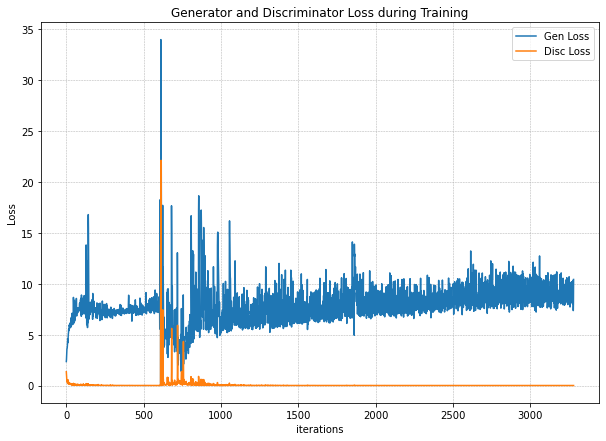

In [13]:
# plot the training loss for generator and discriminator
plt.figure(figsize=(10,7))
plt.title("Generator and Discriminator Loss during Training")
plt.plot(gen_losses, label="Gen Loss")
plt.plot(disc_losses, label="Disc Loss")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.grid(linestyle = '--', linewidth = 0.5)
plt.legend()
plt.show()

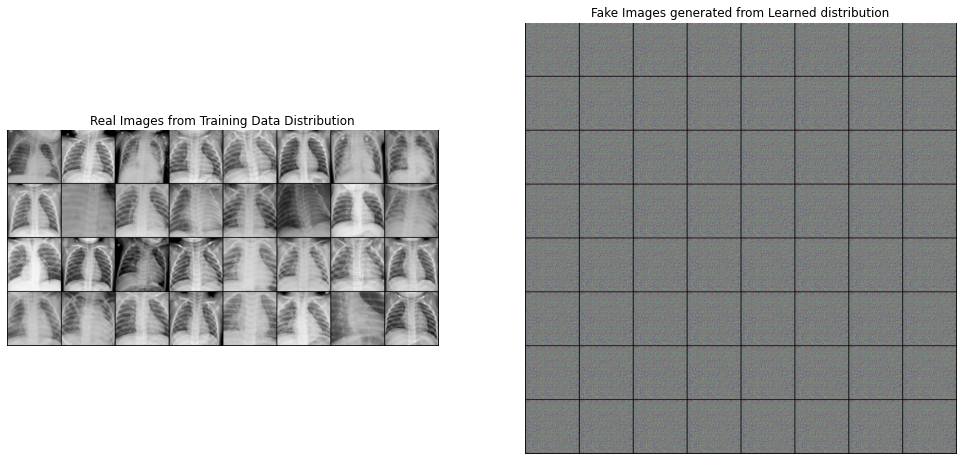

Number of grid images saved: 8


In [14]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(17,17))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images from Training Data Distribution")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(), axes=(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images generated from Learned distribution")
plt.imshow(np.transpose(img_grid_lst[-1].cpu(), axes=(1,2,0)))
plt.show()

print("Number of grid images saved:", len(img_grid_lst))

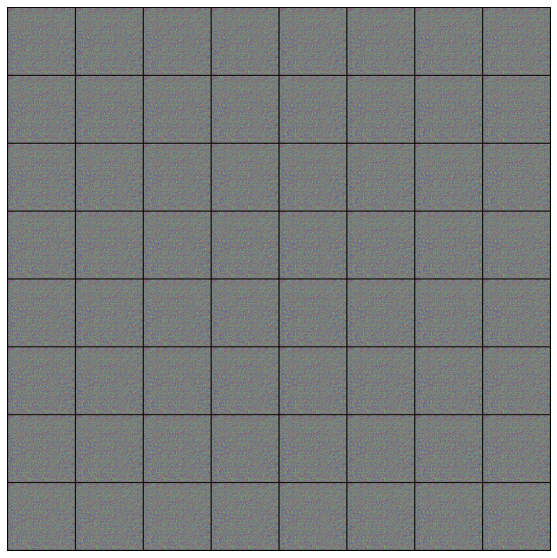

In [15]:
# visualize the training progression of G with an animation
fig = plt.figure(figsize=(10,10))
plt.axis("off")
ims = [[plt.imshow(np.transpose(img_grid.cpu(),(1,2,0)), animated=True)] for img_grid in img_grid_lst]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [16]:
IS_handler = InceptionScore()
FID_handler = FrechetInceptionDistance(feature=64)

/home/sazim/.local/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
Downloading: "https://github.com/toshas/torch-fidelity/releases/download/v0.2.0/weights-inception-2015-12-05-6726825d.pth" to /tmp/xdg-cache/torch/hub/checkpoints/weights-inception-2015-12-05-6726825d.pth


  0%|          | 0.00/91.2M [00:00<?, ?B/s]

/home/sazim/.local/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `FrechetInceptionDistance` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


In [17]:
sample_fake_imgs = gen_net(fixed_noise)
sample_fake_imgs = sample_fake_imgs.detach().cpu()
print("Shape of fake image batch generated:", sample_fake_imgs.shape)

max_val = torch.max(sample_fake_imgs).numpy()
min_val = torch.min(sample_fake_imgs).numpy()
print("Range of fake images (before): [{:0.4f}, {:0.4f}]".format(min_val, max_val))

sample_fake_imgs_uint8 = 255 * (sample_fake_imgs - min_val) / (max_val - min_val)
sample_fake_imgs_uint8 = sample_fake_imgs_uint8.to(torch.uint8)

max_val = torch.max(sample_fake_imgs_uint8).numpy()
min_val = torch.min(sample_fake_imgs_uint8).numpy()
print("Range of fake images (after): [{}, {}]".format(min_val, max_val))

Shape of fake image batch generated: torch.Size([64, 3, 128, 128])
Range of fake images (before): [-0.7287, 0.7715]
Range of fake images (after): [0, 254]


In [18]:
# compute Inception Score
IS_handler.update(sample_fake_imgs_uint8)
inception_score = IS_handler.compute()
print("Inception Score - Mean: {:0.4f}, Std: {:0.4f}".format(inception_score[0].numpy(), inception_score[1].numpy()))

Inception Score - Mean: 1.0010, Std: 0.0006


In [19]:
# compute FID metrics score
sample_real_imgs = next(iter(dataloader))
sample_real_imgs = sample_real_imgs[0][:64]

max_val = torch.max(sample_real_imgs).numpy()
min_val = torch.min(sample_real_imgs).numpy()
print("Range of real images (before): [{:0.4f}, {:0.4f}]".format(min_val, max_val))

sample_real_imgs_uint8 = 255 * (sample_real_imgs - min_val) / (max_val - min_val)
sample_real_imgs_uint8 = sample_real_imgs_uint8.to(torch.uint8)

max_val = torch.max(sample_real_imgs_uint8).numpy()
min_val = torch.min(sample_real_imgs_uint8).numpy()
print("Range of real images (after): [{}, {}]".format(min_val, max_val))

FID_handler.update(sample_real_imgs_uint8, real=True)
FID_handler.update(sample_fake_imgs_uint8, real=False)
FID_score = FID_handler.compute()

print("FID Score:", FID_score.numpy())

Range of real images (before): [-1.0000, 0.9843]
Range of real images (after): [0, 255]
FID Score: 148.62708
